In [1]:
#importing required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import cv2 as cv
import matplotlib.pylab as plt
from PIL import Image
from skimage import io 

## a.	Visualize the image

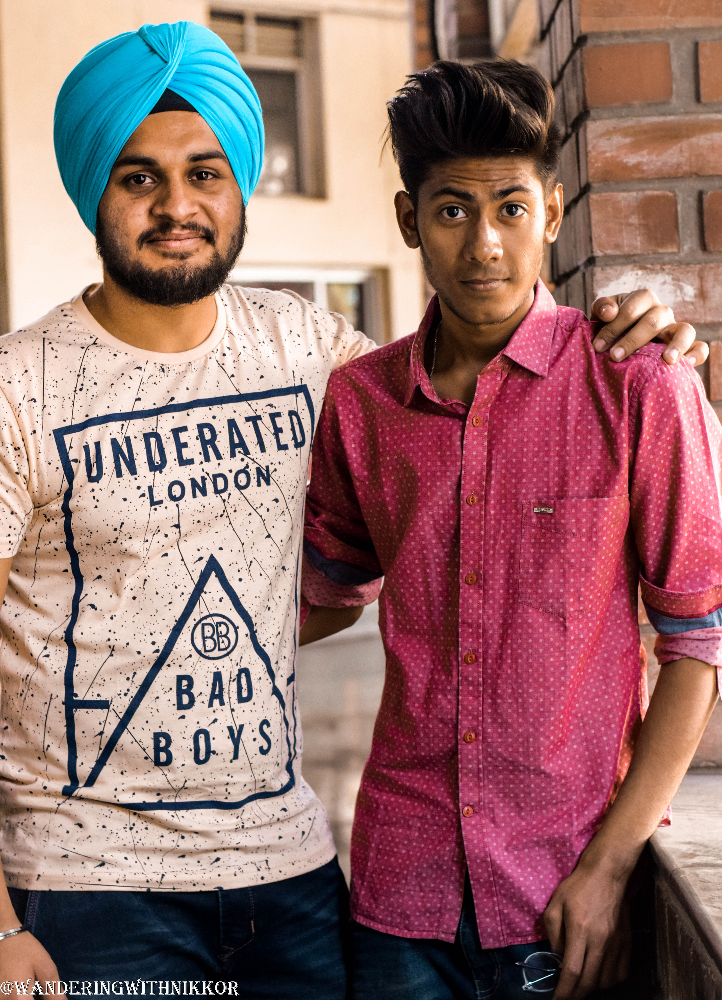

In [2]:
mac = Image.open('C:/Users/hp/Pictures/pictures/chandigarh/_DSC0003.jpg')

mac

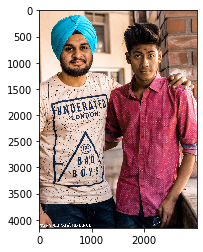

In [3]:
img=io.imread('C:/Users/hp/Pictures/pictures/chandigarh/_DSC0003.jpg')
plt.imshow(mac)

## b.	Convert it into a gray-level image and read it as a 2D array of Numpy

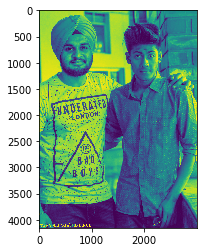

In [4]:
gray_image=cv.cvtColor(img, cv.COLOR_RGB2GRAY)
plt.imshow(gray_image)

In [5]:
type(gray_image)



numpy.ndarray

In [6]:
print(gray_image)
gray_image.shape

[[190 189 188 ... 124 124 123]
 [189 188 188 ... 124 123 122]
 [187 187 187 ... 123 121 120]
 ...
 [103 103 104 ...  54  63  68]
 [105 106 106 ...  51  58  63]
 [107 107 107 ...  50  55  59]]


(4152, 3000)

## perform the image compression (low rank approximation)

In [7]:
U,S,V=np.linalg.svd(gray_image)

In [8]:

print(S)

[4.65760420e+05 1.00259941e+05 5.71246417e+04 ... 4.21223553e+00
 4.15346908e+00 4.04466228e+00]


In [9]:
var_explained=np.round(S**2/np.sum(S*2),decimals=3)

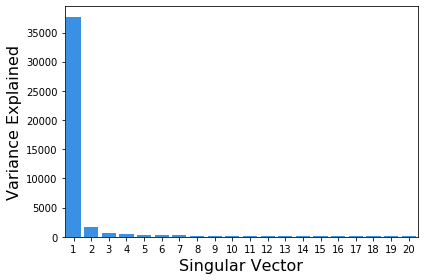

In [10]:
sns.barplot(x=list(range(1,21)),
            y=var_explained[0:20], color="dodgerblue")
plt.xlabel('Singular Vector', fontsize=16)
plt.ylabel('Variance Explained', fontsize=16)
plt.tight_layout()
plt.savefig('svd_scree_plot.png',dpi=150, figsize=(8,6))


## choosing 10% top SVDs, 20% top SVDs, 50% SVDs

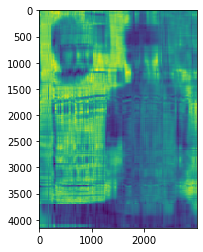

In [11]:
num_components = 10
reconst_img_10 = np.array(U[:, :num_components]) .dot(np.diag(S[:num_components]).dot(
                np.array(V[:num_components, :])))
plt.imshow(reconst_img_10)


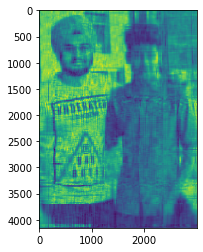

In [12]:
num_components = 20
reconst_img_20 = np.array(U[:, :num_components]) .dot(np.diag(S[:num_components]).dot(
                np.array(V[:num_components, :])))
plt.imshow(reconst_img_20)


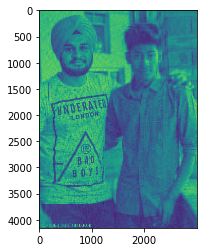

In [14]:
num_components=50
reconst_img_50=np.array(U[:,:num_components]).dot(np.diag(S[:num_components]).dot(np.array(V[:num_components,:])))
plt.imshow(reconst_img_50)

## visualizing all these images


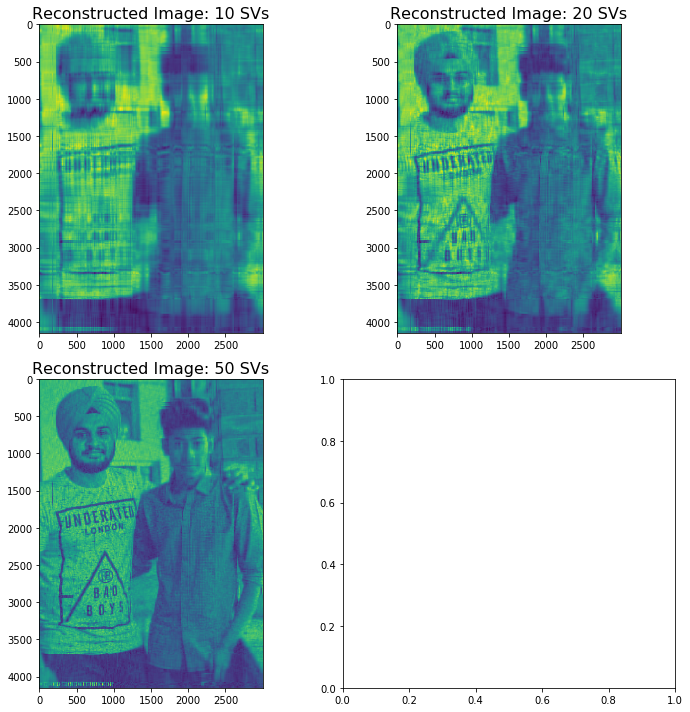

In [16]:
fig, axs = plt.subplots(2, 2,figsize=(10,10))
axs[0, 0].imshow(reconst_img_10)
axs[0, 0].set_title('Reconstructed Image: 10 SVs', size=16)
axs[0, 1].imshow(reconst_img_20)
axs[0, 1].set_title('Reconstructed Image: 20 SVs', size=16)
axs[1, 0].imshow(reconst_img_50)
axs[1, 0].set_title('Reconstructed Image: 50 SVs', size=16)
plt.tight_layout()